# Data Science Fundamentals 5

Basic introduction on how to perform typical machine learning tasks with Python.

Prepared by Mykhailo Vladymyrov & Aris Marcolongo,
Science IT Support, University Of Bern, 2020

This work is licensed under <a href="https://creativecommons.org/share-your-work/public-domain/cc0/">CC0</a>.

# Solutions to Part 3.

In [0]:
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.mixture import GaussianMixture

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from matplotlib import  pyplot as plt
import numpy as np
import pandas as pd
from imageio import imread
from time import time as timer
import os

import tensorflow as tf

%matplotlib inline
from matplotlib import animation
from IPython.display import HTML

import umap
from scipy.stats import entropy

In [2]:
if not os.path.exists('data'):
    path = os.path.abspath('.')+'/colab_material.tgz'
    tf.keras.utils.get_file(path, 'https://github.com/neworldemancer/DSF5/raw/master/colab_material.tgz')
    !tar -xvzf colab_material.tgz > /dev/null 2>&1

98304/96847 [==============================] - 0s 0us/step


In [0]:
from utils.routines import *

# EXERCISE 1: Discover the number of Gaussians

Number of clusters considered:  2
Number of clusters considered:  3
Number of clusters considered:  4
Number of clusters considered:  5
Number of clusters considered:  6
Number of clusters considered:  7
Number of clusters considered:  8
Number of clusters considered:  9
Number of clusters considered:  10
Number of clusters considered:  11
Number of clusters considered:  12
Number of clusters considered:  13
Number of clusters considered:  14


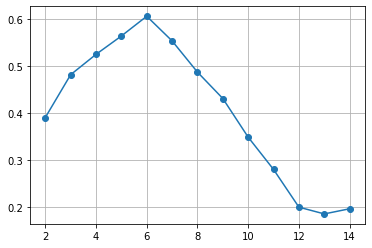

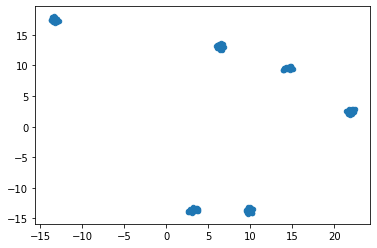

In [4]:
### In this exercise you are given the dataset points, consisting of high-dimensional data. It was built taking random 
#samples from a number k of multimensional gaussians. The data is therefore made of k clusters but, being 
#very high dimensional, you cannot visualize it. Your task it too use K-means combined with the Silouhette 
#score to find the number of k.

# 1. Load the data using the function load_ex1_data_clust() , check the dimensionality of the data.

points=load_ex1_data_clust()

# 2. Fix a number of clusters k and define a KMeans clusterer object. Perform the fitting and compute the Silhouette score. 
# Save the results on a list. 

plt.figure()
scores=[]
for itrial in range(2,15):
    print('Number of clusters considered: ',itrial)
    clusterer = KMeans(n_clusters=itrial, random_state=10)
    cluster_labels = clusterer.fit_predict(points)
    score=silhouette_score(points,cluster_labels)
    scores.append(score)

# 3. Plot the Silhouette scores as a function ok k? What is the number of clusters ?
plt.grid()
plt.plot(np.arange(len(scores))+2,np.array(scores),'-o')

# 4. Optional. Check the result that you found via umap. 
plt.figure()
umap_model = umap.UMAP(random_state=1711)
umap_gs = umap_model.fit_transform(points)
plt.scatter(umap_gs[:, 0], umap_gs [:, 1], s=20)

# EXERCISE 2: Predict the good using K-Means

In [5]:
#In this exercise you are asked to use the clustering performed by K-means to predict the good in the f-mnist dataset. 
#Here we are using the clustering as a preprocessing for a supervised task. We need therefore the correct labels 
#on a training set and #o test the result on a test set:

# 1. Load the dataset.

fmnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fmnist.load_data()

X_train=train_images[:5000,:].reshape(5000,-1)
y_train=train_labels[:5000]

X_test=test_images[:1000,:].reshape(1000,-1)
y_test=test_labels[:1000]

# 2. FITTING STEP: The fitting step consists first here in the computation of the cluster center, which was done during 
# the presentation. Second, to each cluster center we need than to assign a good-label, which will be given by the 
# majority class of the sample belonging to that cluster. 

def most_common(nclusters, supervised_labels, cluster_labels):
    
    """
    Args:
    - nclusters : the number of clusteres
    - supervised_labels : for each sample, the labelling provided by the training data ( e.g. in y_train or y_test)
    - cluster_labels : for each good, the cluster it was assigned by K-Means using the predict method of the Kmeans object
    
    Returns:
    - a list "assignement" of lengths nclusters, where assignement[i] is the majority class of the i-cluster 
    """
    
    assignement=[]
    for icluster in range(nclusters):
        indices=list(supervised_labels[cluster_labels==icluster])
        try:
            chosen= max(set(indices), key=indices.count)
        except ValueError :
            print('Em')
            chosen=1
        assignement.append(chosen)
        
    return assignement


clusterer = KMeans(n_clusters=10, random_state=10)

clusterer.fit(X_train)

cluster_labels = clusterer.predict(X_train)
assignement=most_common(10, y_train, cluster_labels)     

print(assignement)

print('Training set')

cluster_labels = clusterer.predict(X_train)

new_labels=[assignement[i] for i in cluster_labels]

cm=metrics.confusion_matrix( y_train, new_labels)

print(np.sum([cm[i,i] for i in range(cm.shape[0])])/np.sum(cm))
print(cm)

# 3. Using the assignment list and the clusterer, check the performance on the test set.

print()
print('Test set')

cluster_labels = clusterer.predict(X_test)
 
new_labels=[assignement[i] for i in cluster_labels]

cm=metrics.confusion_matrix( y_test, new_labels)

print(np.sum([cm[i,i] for i in range(cm.shape[0])])/np.sum(cm))
print(cm)

# 4. Perform again steps 2 / 3 increasing the number of clusters from 10 to 40 what happens to the performance ?

for iclust in [10,20,30,40]:
    
        clusterer = KMeans(n_clusters=iclust, random_state=10)

        clusterer.fit(X_train)

        cluster_labels = clusterer.predict(X_train)
    
        assignement=most_common(iclust, y_train, cluster_labels)     

        print(assignement)
        
        print('Test set with '+str(iclust)+' clusters')

        cluster_labels = clusterer.predict(X_test)

        new_labels=[assignement[i] for i in cluster_labels]

        cm=metrics.confusion_matrix( y_test, new_labels)

        print(np.sum([cm[i,i] for i in range(cm.shape[0])])/np.sum(cm))
        print(cm)

4423680/4422102 [==============================] - 0s 0us/step
[4, 6, 9, 3, 7, 0, 8, 8, 9, 1]
Training set
0.5492
[[248   6   0  62   6   0 131   1   3   0]
 [  1 482   0  37   8   0  28   0   0   0]
 [  5   0   0  14 324   0 153   1   7   0]
 [  7 165   0 223   5   0 101   0   0   0]
 [  2   2   0  77 333   0  68   0   6   0]
 [  0   0   0   0   0   0 111 291   2  89]
 [ 68   3   0  52 181   0 178   1   9   1]
 [  0   0   0   0   0   0   0 410   0 102]
 [  0   0   0   7  16   0  46  25 378  18]
 [  0   0   0   0   0   0  10   2   0 494]]

Test set
0.558
[[60  0  0 12  4  0 31  0  0  0]
 [ 0 94  0  6  0  0  5  0  0  0]
 [ 2  0  0  2 71  0 35  0  1  0]
 [ 2 25  0 48  1  0 17  0  0  0]
 [ 0  1  0 23 79  0 12  0  0  0]
 [ 0  0  0  0  0  0 17 55  0 15]
 [12  1  0  9 32  0 41  0  2  0]
 [ 0  0  0  0  0  0  0 78  0 17]
 [ 0  0  0  1  5  0 14  3 67  5]
 [ 0  0  0  0  0  0  1  3  0 91]]
[4, 6, 9, 3, 7, 0, 8, 8, 9, 1]
Test set with 10 clusters
0.558
[[60  0  0 12  4  0 31  0  0  0]
 [ 0 94  0  

# EXERCISE 3 : Find the prediction uncertainty

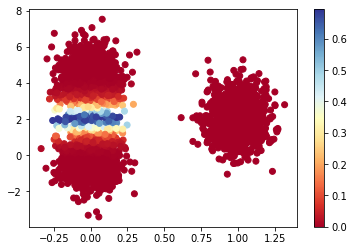

In [6]:
#In this exercise you need to load the dataset used to present K-means ( def km_load_th1() ) or the one used to discuss 
# the Gaussian mixtures model ( def km_load_th1() ). 
#As discussed, applying a fitting based on gaussian mixtures you can not only predict the cluster label for each point, 
#but also a probability distribution over the clusters. 

#From this probability distribution, you can compute for each point the entropy of the corresponging 
#distribution (using for example scipy.stats.entropy) as an estimation of the undertainty of the prediction. 
#Your task is to plot the data-cloud with a color proportional to the uncertainty of the cluster assignement.

# In detail you shoud:
# 1. Instantiate a GaussianMixture object with the number of clusters that you expect
# 2. fit the object on the dataset with the fit method 

from scipy.stats import entropy
points=gm_load_th1()

plt.figure()
clf = GaussianMixture(n_components=3, covariance_type='full')

clf.fit(points)

# 3. compute the cluster probabilities using the method predict_proba. This will return a matrix of 
# dimension npoints x nclusters
# 4. use the entropy function ( from scipy.stats import entropy ) to evaluate for each point the uncertainty of the 
#prediction

cluster_labels_prob=clf.predict_proba(points)

entropies=[]
for point in range(len(cluster_labels_prob)):
    entropies.append(entropy(cluster_labels_prob[point]))

# 5. Plot the points colored accordingly to their uncertanty. 

cm = plt.cm.get_cmap('RdYlBu')
sc = plt.scatter(points[:,0], points[:,1], c=entropies, cmap=cm)
plt.colorbar(sc)
    

# EXERCISE 4.

Load some image, downscale to a similar resolution, and train a deeper model, for example 5 layers, more parameters in widest layers.

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 2)                 0         
_________________________________________________________________
dense (Dense)                (None, 32)                96        
_________________________________________________________________
dense_1 (Dense)              (None, 512)               16896     
_________________________________________________________________
dense_2 (Dense)              (None, 64)                32832     
_________________________________________________________________
dense_3 (Dense)              (None, 16)                1040      
_________________________________________________________________
dense_4 (Dense)              (None, 8)                 136       
_________________________________________________________________
dense_5 (Dense)              (None, 3)                 2

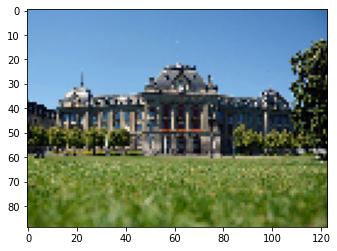

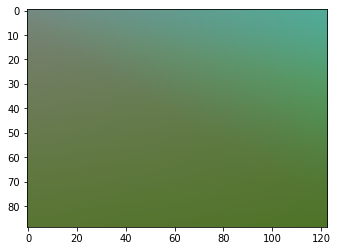

In [7]:
# solution

# 1. Load your image
image_big = imread('https://www.unibe.ch/unibe/portal/content/carousel/showitem940548/UniBE_Coronavirus_612p_eng.jpg')
image_big = image_big[...,0:3]/255
plt.imshow(image_big)

image = image_big[::5, ::5]
plt.imshow(image)
plt.show()

h, w, c = image.shape
X = np.meshgrid(np.linspace(0, 1, w), np.linspace(0, 1, h))
X = np.stack(X, axis=-1).reshape((-1, 2))

Y = image.reshape((-1, c))
X.shape, Y.shape


# 2. build a deeper model
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(2,)),
  tf.keras.layers.Dense(32, activation=tf.keras.layers.LeakyReLU()),
  tf.keras.layers.Dense(512, activation=tf.keras.layers.LeakyReLU()),
  tf.keras.layers.Dense(64, activation=tf.keras.layers.LeakyReLU()),
  tf.keras.layers.Dense(16, activation=tf.keras.layers.LeakyReLU()),
  tf.keras.layers.Dense(8, activation=tf.keras.layers.LeakyReLU()),
  tf.keras.layers.Dense(c, activation='sigmoid'),
])
model.compile(optimizer='adam',
              loss='mae',
              metrics=['mse'])
model.summary()

# 3. inspect the evolution

ims = []
n_ep_tot = 0
for i in range(200):
  if i % 10 == 0:
    print(f'epoch {i}', end='\n')
  ne = (2 if (i<50) else (20 if (i<100) else (200 if (i<150) else 1000)))
  model.fit(X, Y, epochs=ne, batch_size=1*2048, verbose=0)

  Y_p = model.predict(X)
  Y_p = Y_p.reshape((h, w, c))
  ims.append(Y_p)
  n_ep_tot += ne

print(f'total numer of epochs trained:{n_ep_tot}')

plt.rcParams["animation.html"] = "jshtml"  # for matplotlib 2.1 and above, uses JavaScript
fig = plt.figure()
im = plt.imshow(ims[0])

def animate(i):
    img = ims[i]
    im.set_data(img)
    return im

ani = animation.FuncAnimation(fig, animate, frames=len(ims))

ani